# Process Bayesian inference results (Poisson)

Post-process saved MCMC tracers from `BayesianInversion.ipynb`.

Requires `Results/ground_truth/data.npz` and a completed MCMC run folder under `Results/`.

In [1]:
import os
import pickle
import shutil
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
from dolfinx import mesh
from dolfinx.fem import functionspace
from dolfinx.mesh import CellType
from mpi4py import MPI
from mpl_toolkits.axes_grid1 import make_axes_locatable

NOTEBOOK_DIR = os.getcwd()
APP_DIR = os.path.abspath(os.path.join(NOTEBOOK_DIR, ".."))
ROOT = os.path.abspath(os.path.join(APP_DIR, "..", "..", ".."))
MODEL_DIR = os.path.join(ROOT, "survey_work/problems/poisson")

sys.path.insert(0, os.path.join(ROOT, "src/plotting"))
sys.path.insert(0, os.path.join(ROOT, "src/data"))
sys.path.insert(0, os.path.join(ROOT, "src/prior"))
sys.path.insert(0, os.path.join(ROOT, "src/mcmc"))
sys.path.insert(0, os.path.join(ROOT, "src/nn"))
sys.path.insert(0, os.path.join(ROOT, "src/nn/deeponet"))
sys.path.insert(0, os.path.join(ROOT, "src/nn/pcanet"))
sys.path.insert(0, os.path.join(ROOT, "src/nn/fno"))
sys.path.insert(0, os.path.join(ROOT, "src/nn/mlp"))
sys.path.insert(0, MODEL_DIR)

from field_plot import field_plot
from mcmc import MCMC
from mcmc_postprocess import plot_mcmc_tracer_results
from plot_curve import plot_curve
from point_plot import point_plot
from poissonModel import PoissonModel
from priorSampler import PriorSampler
from nn_util import load_surrogate_model

plt.rcParams["text.latex.preamble"] = r"\usepackage{amsmath}"

seed = 0
np.random.seed(seed)
torch.manual_seed(seed);

In [2]:
# --- configuration ---
DATA_PREFIX = "Poisson"
U_COMPS = 1

prior_ac = 0.005
prior_cc = 0.2
prior_logn_scale = 1.0
prior_logn_translate = 0.0

n_samples = 10000
n_burnin = 500
pcn_beta = 0.2

RESULTS_DIR = os.path.join(APP_DIR, "Results")
GROUND_TRUTH_DIR = os.path.join(RESULTS_DIR, "ground_truth")
MCMC_RUN_DIR = os.path.join(
    RESULTS_DIR,
    "mcmc_n_samples_10000_n_burnin_500_pcn_beta_0.200_sigma_1.323e-01",
)
OUTPUT_DIR = os.path.join(NOTEBOOK_DIR, "Results")
os.makedirs(OUTPUT_DIR, exist_ok=True)

RUN_CONFIGS = [
    ("True", os.path.join(MCMC_RUN_DIR, "true_model"), None),
    ("DeepONet", os.path.join(MCMC_RUN_DIR, "surrogate_DeepONet"), "DeepONet"),
    ("PCANet", os.path.join(MCMC_RUN_DIR, "surrogate_PCANet"), "PCANet"),
    ("FNO", os.path.join(MCMC_RUN_DIR, "surrogate_FNO"), "FNO"),
]

RUN_LABEL_COLORS = {
    "True": "#f68612",
    "DeepONet": "#176fc1",
    "PCANet": "#139a51",
    "FNO": "#ec1c24",
}

MCMC_PP_PARAMS = {
    "curve_plot": {"fs": 20, "lw": 3, "figsize": (6, 4)},
    "field_plot": {
        "fs": 24,
        "y_sup_title": 1.075,
        "figsize": (20, 12),
        "ttl_pad": 10,
        "title_x": [0.6, 0.65, 0.65, 0.6],
    },
}

FIELD_SUPTITLE = (
    r"Ground truth, posterior sample, and posterior mean $(w, m, u(m), u_{obs})$"
)


## Model, surrogates, and ground truth

In [3]:
nx, ny = 50, 50
fe_order = 1

domain = mesh.create_unit_square(MPI.COMM_WORLD, nx, ny, cell_type=CellType.triangle)
Vm = functionspace(domain, ("Lagrange", fe_order))
Vu = Vm

prior_sampler = PriorSampler(Vm, prior_ac, prior_cc, seed)
model = PoissonModel(
    Vm, Vu, prior_sampler, prior_logn_scale, prior_logn_translate, seed
)
nodes = model.m_nodes

surrogate_models = {}
for name in ("DeepONet", "PCANet", "FNO"):
    sm = load_surrogate_model(name, DATA_PREFIX, MODEL_DIR, model, u_comps=U_COMPS)
    if sm is not None:
        surrogate_models[name] = sm

ground_truth_data = np.load(os.path.join(GROUND_TRUTH_DIR, "data.npz"))
num_grid_x = int(ground_truth_data["num_grid_x"])
num_grid_y = int(ground_truth_data["num_grid_y"])
w_true = ground_truth_data["w_true"]
m_true = ground_truth_data["m_true"]
u_true = ground_truth_data["u_true"]
x_obs = ground_truth_data["x_obs"]
u_obs = ground_truth_data["u_obs"]

u_obs_mean, u_obs_std = np.mean(u_obs), np.std(u_obs)
sigma_noise = 0.05 * u_obs_mean
print(
    f"u_obs_mean = {u_obs_mean:.3e}, u_obs_std = {u_obs_std:.3e}, sigma_noise = {sigma_noise:.3e}"
)

DeepONet nn_data:  <dataMethods.DataProcessor object at 0x338b15340>
DeepONet nn_model:  DeepONet(
  (branch_net): MLP(
    (layers): ModuleList(
      (0): Linear(in_features=2601, out_features=64, bias=True)
      (1): Linear(in_features=64, out_features=64, bias=True)
      (2): Linear(in_features=64, out_features=100, bias=True)
    )
  )
  (trunk_net): MLP(
    (layers): ModuleList(
      (0): Linear(in_features=2, out_features=64, bias=True)
      (1): Linear(in_features=64, out_features=64, bias=True)
      (2): Linear(in_features=64, out_features=100, bias=True)
    )
  )
)
PCANet nn_data:  <dataMethods.DataProcessor object at 0x34142ec60>
PCANet nn_model:  PCANet(
  (net): MLP(
    (layers): ModuleList(
      (0): Linear(in_features=200, out_features=300, bias=True)
      (1): Linear(in_features=300, out_features=300, bias=True)
      (2): Linear(in_features=300, out_features=100, bias=True)
    )
  )
)
FNO nn_data:  <dataMethods.DataProcessorFNO object at 0x112190620>
FNO nn_

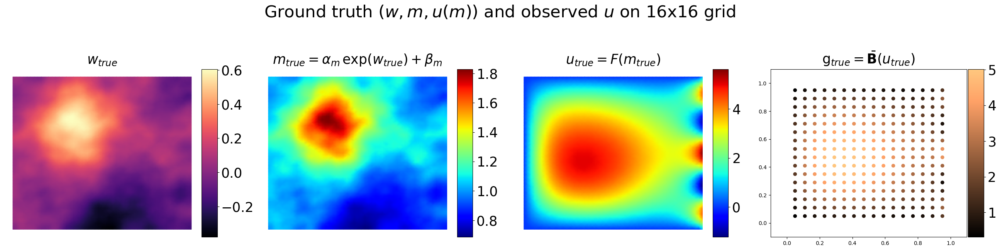

Saved /Users/prashant/Dropbox/Work/Simulations/neuralnet_works/error_corrector_direction/neural_operators/survey_work/applications/bayesian_inverse_problem_poisson/prcessed_results/Results/true_and_obs_w_m_u.png


In [4]:
rows, cols = 1, 4
fig, axs = plt.subplots(rows, cols, figsize=(26, 6))
axs = np.atleast_1d(axs)

uvec = [w_true, m_true, u_true]
title_vec = [
    r"$w_{true}$",
    r"$m_{true} = \alpha_m\, \exp(w_{true}) + \beta_m$",
    r"$u_{true} = F(m_{true})$",
    r"$\mathrm{g}_{true} = \bar{\mathbf{B}}(u_{true})$",
]
cmap_vec = ["magma", "jet", "jet", "copper"]
fs = 25

for j in range(cols - 1):
    cbar = field_plot(axs[j], uvec[j], nodes, cmap=cmap_vec[j])
    axs[j].axis("off")
    divider = make_axes_locatable(axs[j])
    cax = divider.append_axes("right", size="8%", pad=0.03)
    cax.tick_params(labelsize=fs)
    fig.colorbar(cbar, cax=cax, orientation="vertical")
    axs[j].set_title(title_vec[j], fontsize=fs, pad=10)

axs[-1].set_xlim([-0.1, 1.1])
axs[-1].set_ylim([-0.1, 1.1])
cbar = point_plot(axs[-1], u_obs, x_obs, cmap=cmap_vec[-1])
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="8%", pad=0.03)
cax.tick_params(labelsize=fs)
fig.colorbar(cbar, cax=cax, orientation="vertical")
axs[-1].set_title(title_vec[-1], fontsize=fs, pad=10)

fig.suptitle(
    rf"Ground truth $(w, m, u(m))$ and observed $u$ on {num_grid_x}x{num_grid_y} grid",
    fontsize=1.25 * fs,
    y=1.075,
)
fig.tight_layout()
ground_truth_fig = os.path.join(OUTPUT_DIR, "true_and_obs_w_m_u.png")
plt.savefig(ground_truth_fig, bbox_inches="tight")
plt.show()
print(f"Saved {ground_truth_fig}")

## MCMC object for post-processing

In [5]:
mcmc = MCMC(
    model,
    prior_sampler,
    ground_truth_data,
    sigma_noise=sigma_noise,
    pcn_beta=pcn_beta,
    surrogate_to_use=None,
    surrogate_models=surrogate_models,
    seed=seed,
)


def export_processed_figures(tag, run_dir):
    """Copy regenerated MCMC figures into processed_results/Results."""
    mapping = {
        f"cost_{tag}.png": f"cost_{tag}.png",
        f"acceptance_rate_{tag}.png": f"acceptance_rate_{tag}.png",
        f"true_and_posterior_mean_w_m_u_true_F_for_u_{tag}.png": f"true_and_posterior_mean_w_m_u_{tag}.png",
        f"true_and_posterior_mean_w_m_u_surrogate_F_for_u_{tag}.png": (
            f"true_and_posterior_mean_w_m_u_surrogate_{tag}.png"
        ),
    }
    for src_name, dst_name in mapping.items():
        src = os.path.join(run_dir, src_name)
        if os.path.isfile(src):
            shutil.copy2(src, os.path.join(OUTPUT_DIR, dst_name))


def process_run(tag, run_dir, surrogate_name):
    tracer_path = os.path.join(run_dir, "tracer.pkl")
    if not os.path.isfile(tracer_path):
        print(f"Skipping {tag}: missing {tracer_path}")
        return None

    mcmc.surrogate_to_use = surrogate_name
    field_suptitle = f"{FIELD_SUPTITLE} using {tag}"
    plot_surrogate_forward = surrogate_name is not None

    tracer = plot_mcmc_tracer_results(
        run_dir,
        mcmc,
        MCMC_PP_PARAMS,
        field_suptitle,
        tag=tag,
        plot_surrogate_forward=plot_surrogate_forward,
        save_figures=True,
    )
    export_processed_figures(tag, run_dir)
    print(
        f"{tag}: acceptances={tracer.acceptances}, "
        f"final acceptance rate={tracer.acceptance_rate[-1]:.3e}"
    )
    return tracer

## Process each MCMC run


=== True ===


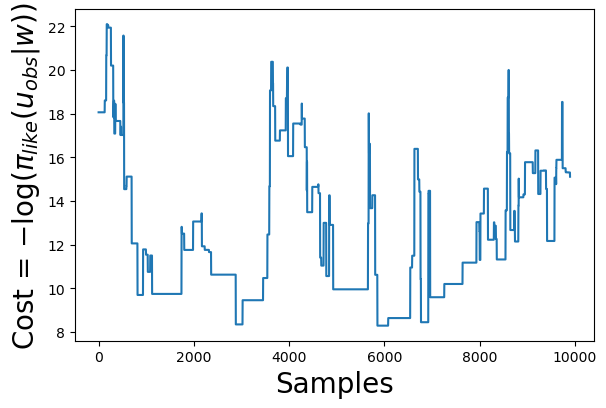

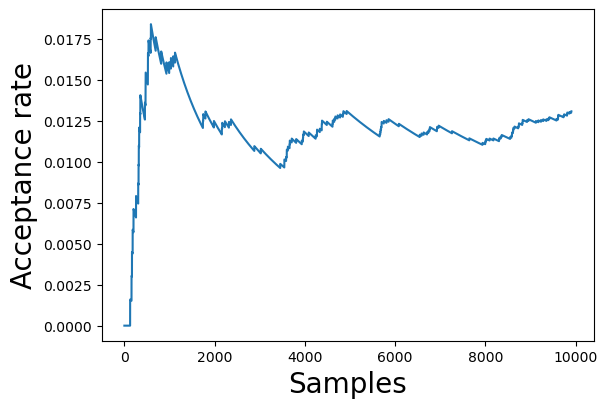

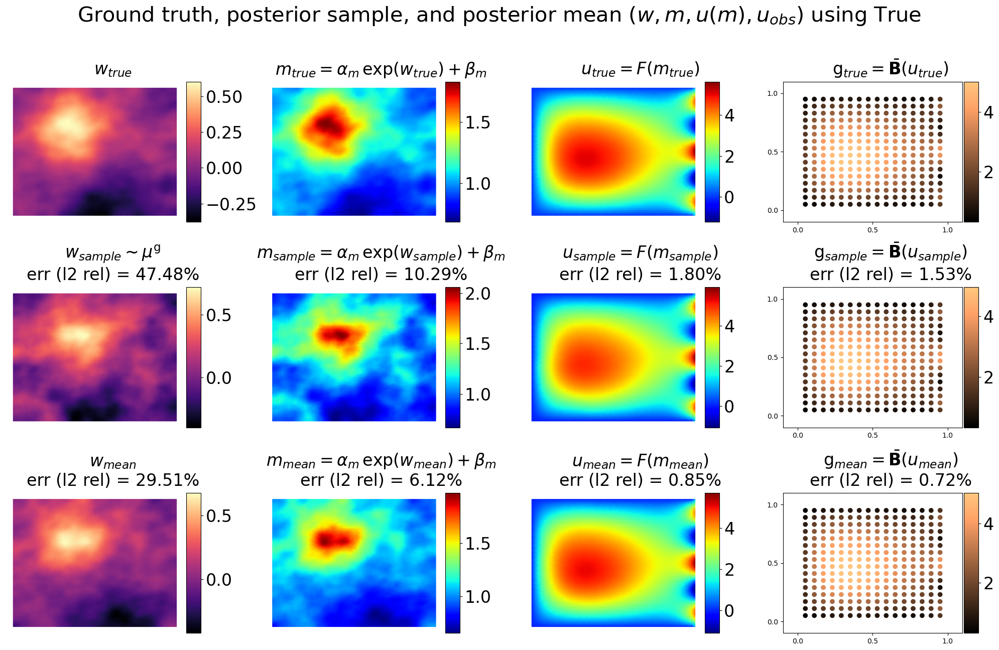

True: acceptances=136, final acceptance rate=1.308e-02

=== DeepONet ===


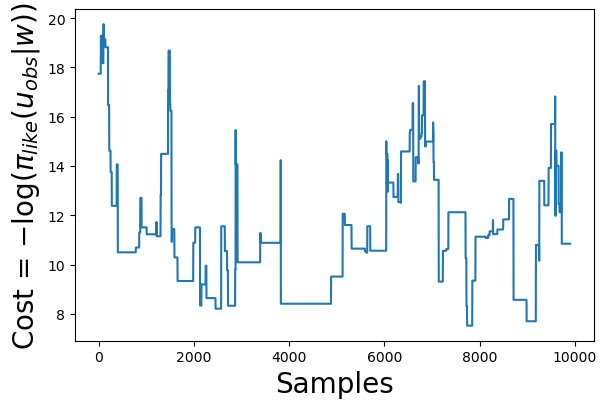

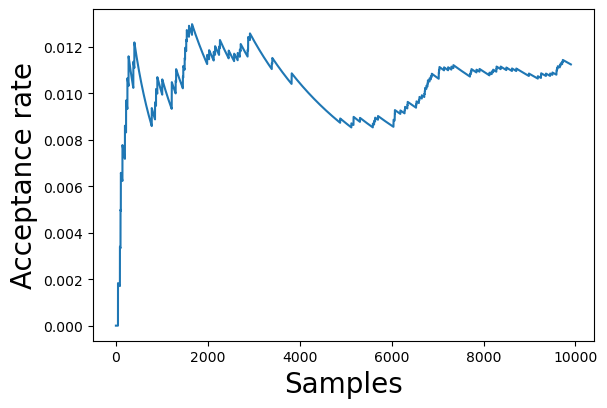

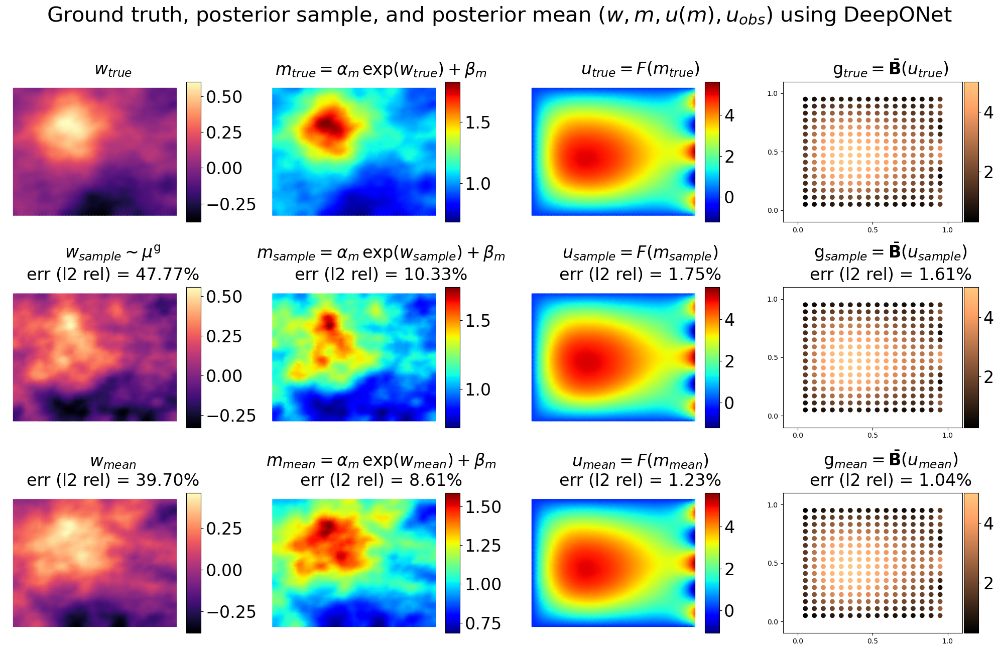

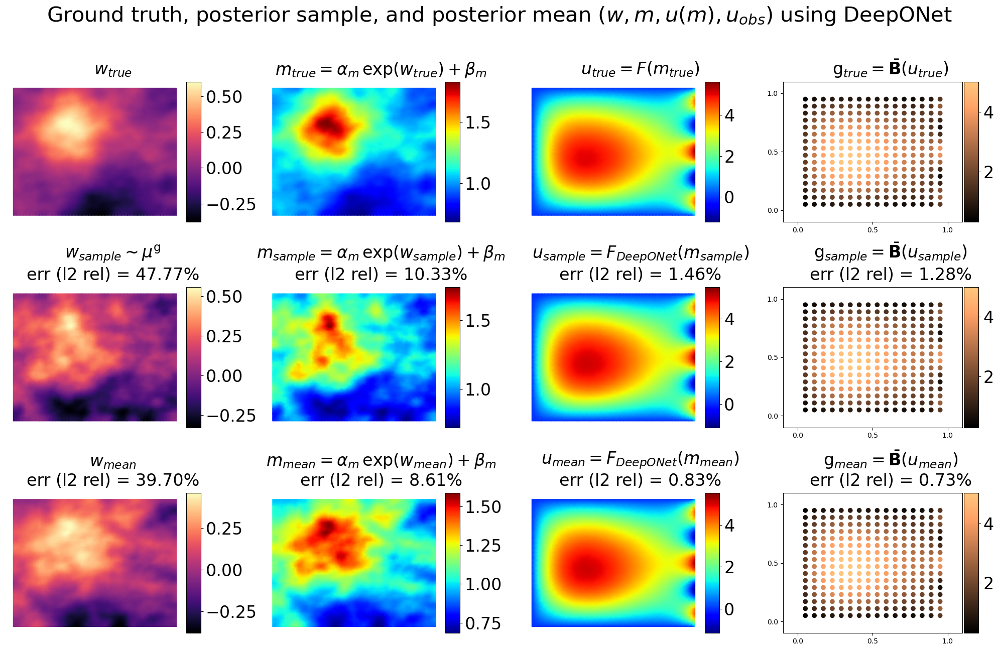

DeepONet: acceptances=117, final acceptance rate=1.125e-02

=== PCANet ===


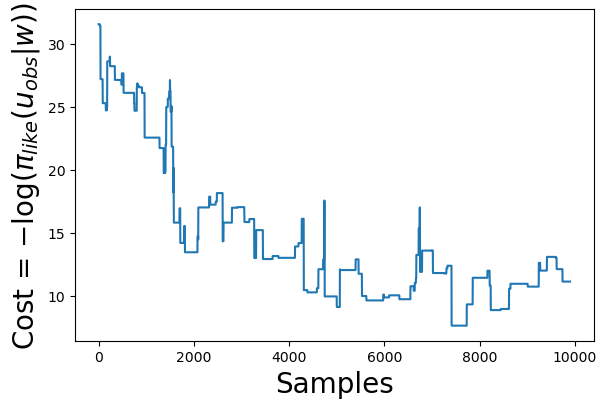

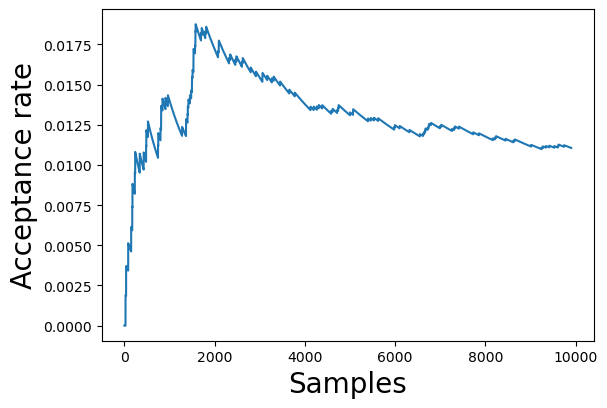

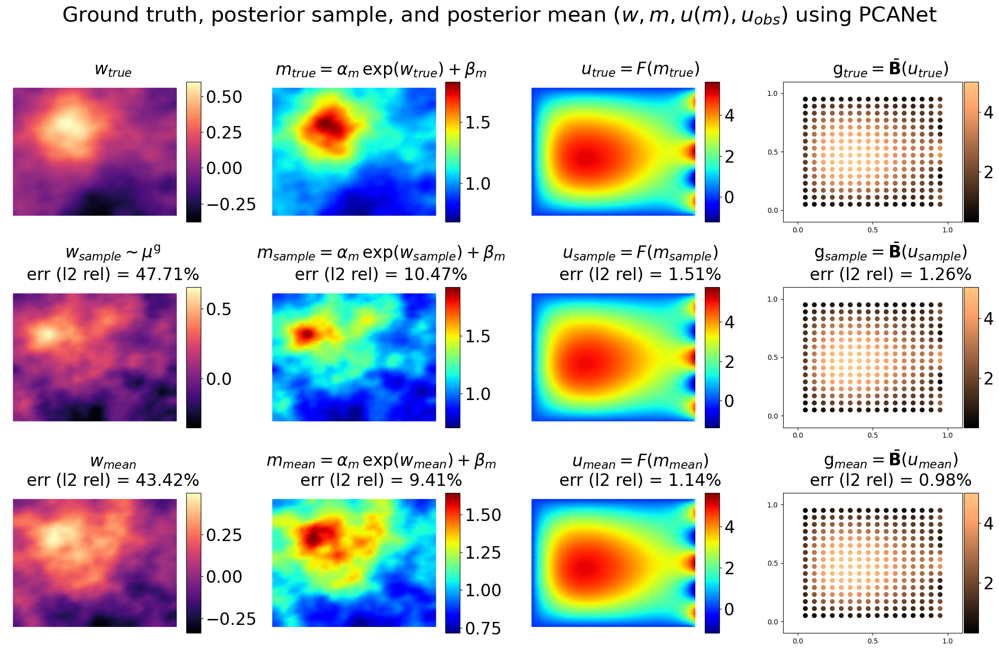

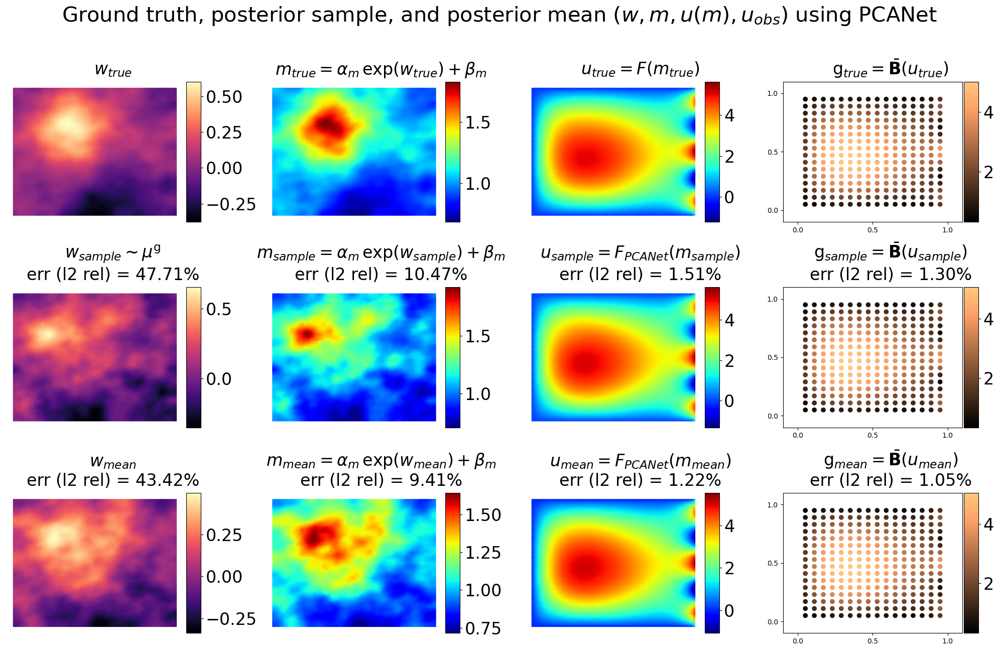

PCANet: acceptances=115, final acceptance rate=1.106e-02

=== FNO ===


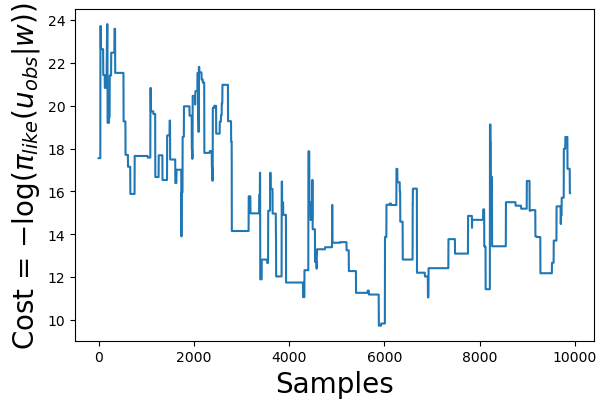

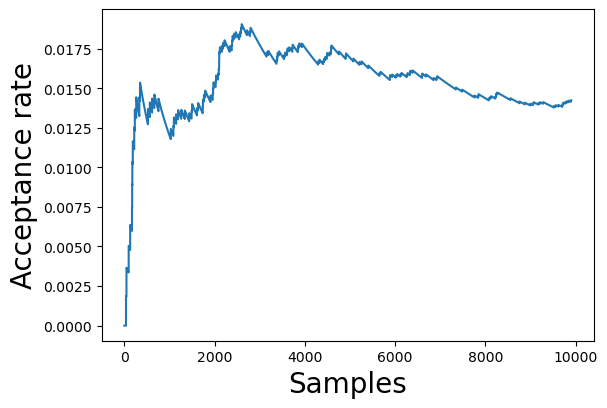

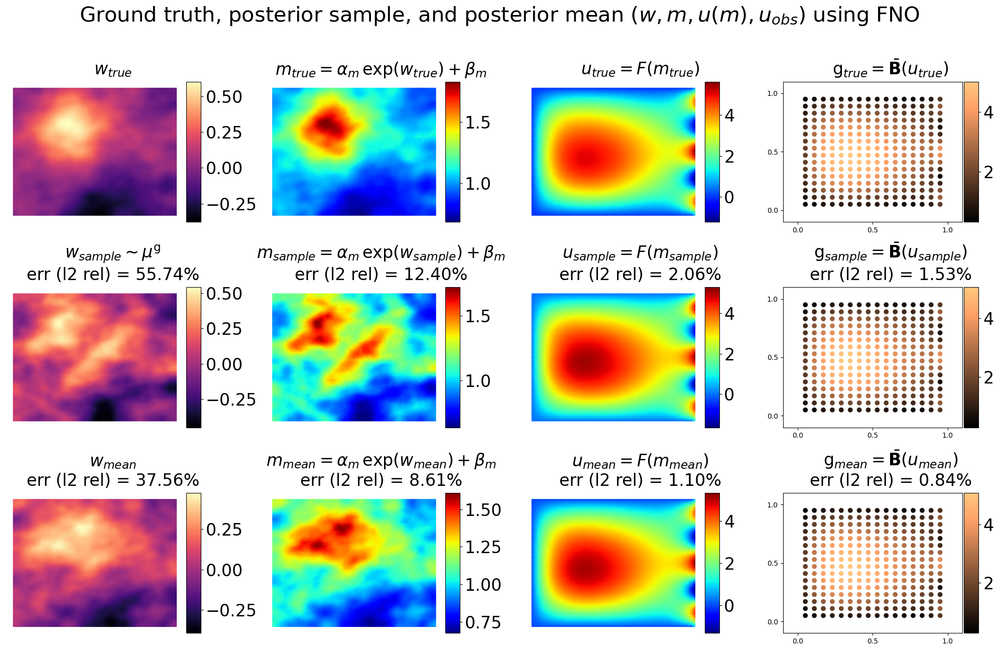

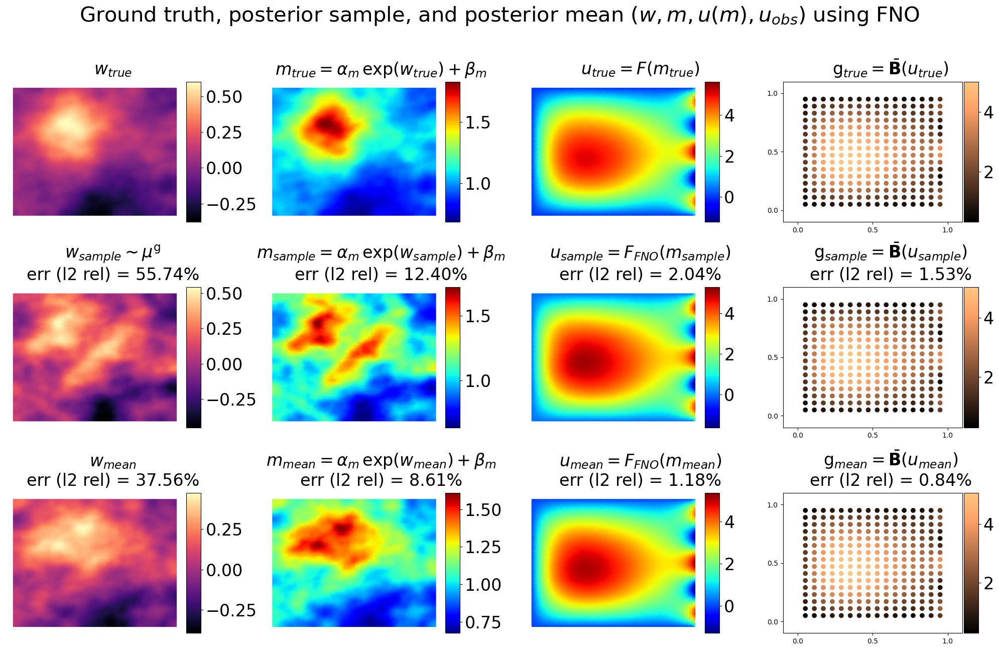

FNO: acceptances=148, final acceptance rate=1.423e-02


In [6]:
tracers = {}
for tag, run_dir, surrogate_name in RUN_CONFIGS:
    print(f"\n=== {tag} ===")
    tracer = process_run(tag, run_dir, surrogate_name)
    if tracer is not None:
        tracers[tag] = tracer

## Compare acceptance rate and cost

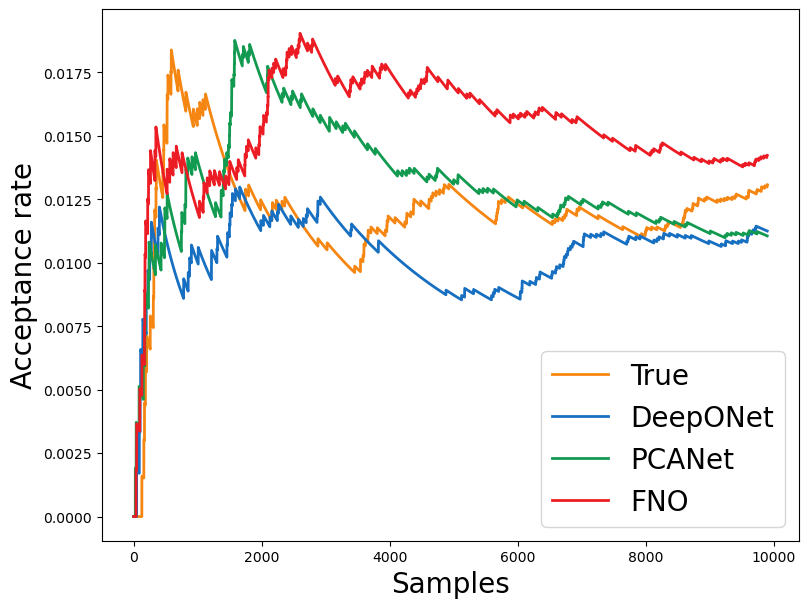

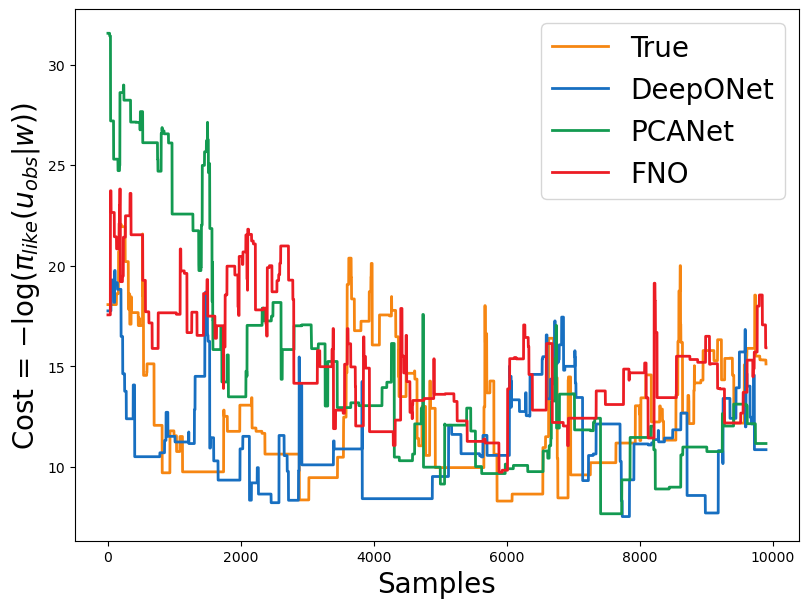

In [7]:
def plot_curve_multi(
    data,
    x=None,
    xl=None,
    yl=None,
    fs=20,
    lw=2,
    lclr=None,
    l_lbl=None,
    title=None,
    savefile=None,
    figsize=(10, 10),
):
    fig, ax = plt.subplots(figsize=figsize)
    x = np.arange(len(data[0])) if x is None else x
    default_colors = [
        "tab:orange", "tab:blue", "tab:green", "tab:red",
        "tab:purple", "tab:brown", "tab:pink", "tab:gray",
    ]
    colors = default_colors if lclr is None else lclr

    for i, series in enumerate(data):
        label = l_lbl[i] if l_lbl is not None and i < len(l_lbl) else None
        ax.plot(x, series, lw=lw, color=colors[i % len(colors)], label=label)

    if xl is not None:
        ax.set_xlabel(xl, fontsize=fs)
    if yl is not None:
        ax.set_ylabel(yl, fontsize=fs)
    if l_lbl is not None:
        ax.legend(fontsize=fs, fancybox=True, frameon=True)
    if title is not None:
        ax.set_title(title, fontsize=fs)

    plt.tight_layout(pad=0.4)
    if savefile is not None:
        plt.savefig(savefile, bbox_inches="tight")
    plt.show()


tags = list(tracers.keys())
colors = [RUN_LABEL_COLORS[t] for t in tags]

plot_curve_multi(
    [tracers[t].acceptance_rate for t in tags],
    fs=20,
    figsize=(8, 6),
    xl=r"Samples",
    yl=r"Acceptance rate",
    lclr=colors[: len(tags)],
    l_lbl=tags,
    savefile=os.path.join(OUTPUT_DIR, "acceptance_rate_comparison.png"),
)

plot_curve_multi(
    [tracers[t].accepted_samples_cost for t in tags],
    fs=20,
    figsize=(8, 6),
    xl=r"Samples",
    yl=r"Cost = $-\log(\pi_{like}(u_{obs} | w))$",
    lclr=colors[: len(tags)],
    l_lbl=tags,
    savefile=os.path.join(OUTPUT_DIR, "cost_comparison.png"),
)
